# Solving classification problems with CatBoost

## Libraries installation

In [1]:
#!pip install --user --upgrade catboost
#!pip install --user --upgrade ipywidgets
#!pip install shap
#!pip install sklearn
#!pip install --upgrade numpy
#!jupyter nbextension enable --py widgetsnbextension

In [2]:
import catboost
print(catboost.__version__)
!python --version

0.23
Python 3.7.4


## Reading the data

In [3]:
import pandas as pd
import os
import numpy as np
np.set_printoptions(precision=4)
import catboost
from catboost import *
from catboost import datasets

In [4]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [5]:
# Print rapido para dimensão do Dataframe
def SZ(df):
    print(f"""
--- Dimensão ---
Linhas:  {df.shape[0]}
Colunas: {df.shape[1]}""")

In [6]:
# Print rapido para dTypes do Dataframe
def DT(df):
    print(f"""
--- DataTypes ---
{df.dtypes}
    """)

In [7]:
df_datatran = pd.read_csv('../output/datatran_processed.csv', encoding='iso-8859-1')
SZ(df_datatran)
DT(df_datatran)

C:\Users\lunet\AppData\Local\Continuum\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (6,28,29,30) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)



--- Dimensão ---
Linhas:  444828
Colunas: 31

--- DataTypes ---
id                        float64
data_inversa               object
dia_semana                 object
horario                    object
uf                         object
br                        float64
km                         object
municipio                  object
causa_acidente             object
tipo_acidente              object
classificacao_acidente     object
fase_dia                   object
sentido_via                object
condicao_metereologica     object
tipo_pista                 object
tracado_via                object
uso_solo                   object
ano                       float64
pessoas                     int64
mortos                      int64
feridos_leves               int64
feridos_graves              int64
ilesos                      int64
ignorados                   int64
feridos                     int64
veiculos                    int64
latitude                  float64
longitude        

In [8]:
df_datatran.loc[df_datatran['mortos'] >= 1, 'houve_vitima_fatal'] = 1
df_datatran['houve_vitima_fatal'].fillna(0, inplace=True)

feature_columns = ['dia_semana', 
                   'uf', 
                   'causa_acidente', 
                   'tipo_acidente', 
                   'fase_dia', 
                   'sentido_via', 
                   'condicao_metereologica', 
                   'tipo_pista']

df_datatran[feature_columns] = df_datatran[feature_columns].fillna('')

## Preparing your data

Label values extraction

In [9]:
y = df_datatran['houve_vitima_fatal']
X = df_datatran[feature_columns]

Categorical features declaration

In [10]:
cat_features = list(range(0, X.shape[1]))
print(cat_features)

[0, 1, 2, 3, 4, 5, 6, 7]


Looking on label balance in dataset

In [11]:
print('Labels: {}'.format(set(y)))
print('Zero count = {}, One count = {}'.format(len(y) - sum(y), sum(y)))

Labels: {0.0, 1.0}
Zero count = 419545.0, One count = 25283.0


Ways to create Pool class

In [12]:
from catboost import Pool
pool = Pool(data=X, label=y, cat_features=cat_features)

In [56]:
from sklearn.model_selection import train_test_split

data = train_test_split(X, y, test_size=0.2, random_state=0)
X_train, X_test, y_train, y_test = data

train_pool = Pool(
    data=X_train,
    label=y_train,
    cat_features=cat_features
)

validation_pool = Pool(
    data=X_test,
    label=y_test,
    cat_features=cat_features
)

## Split your data into train and validation

In [14]:
from sklearn.model_selection import train_test_split
X_train, X_validation, y_train, y_validation = train_test_split(X, y, train_size=0.8, random_state=1234)

## Selecting the objective function

Possible options for binary classification:

`Logloss`

`CrossEntropy` for probabilities in target

In [16]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(
    iterations=5,
    learning_rate=0.1,
    loss_function='Logloss',
    # loss_function='CrossEntropy'
)
model.fit(
    X_train, y_train,
    cat_features=cat_features,
    eval_set=(X_validation, y_validation),
    verbose=False
)
print('Model is fitted: ' + str(model.is_fitted()))
print('Model params:')
print(model.get_params())

Model is fitted: True
Model params:
{'iterations': 5, 'learning_rate': 0.1, 'loss_function': 'Logloss'}


## Stdout of the training

In [17]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(
    iterations=15,
#     verbose=5,
)
model.fit(
    X_train, y_train,
    cat_features=cat_features,
    eval_set=(X_validation, y_validation),
)

Learning rate set to 0.5
0:	learn: 0.3958451	test: 0.3947686	best: 0.3947686 (0)	total: 176ms	remaining: 2.47s
1:	learn: 0.2929734	test: 0.2912075	best: 0.2912075 (1)	total: 317ms	remaining: 2.06s
2:	learn: 0.2489597	test: 0.2466724	best: 0.2466724 (2)	total: 389ms	remaining: 1.56s
3:	learn: 0.2133947	test: 0.2119151	best: 0.2119151 (3)	total: 500ms	remaining: 1.37s
4:	learn: 0.1992109	test: 0.1979792	best: 0.1979792 (4)	total: 630ms	remaining: 1.26s
5:	learn: 0.1920364	test: 0.1911682	best: 0.1911682 (5)	total: 789ms	remaining: 1.18s
6:	learn: 0.1881189	test: 0.1875171	best: 0.1875171 (6)	total: 997ms	remaining: 1.14s
7:	learn: 0.1851602	test: 0.1845245	best: 0.1845245 (7)	total: 1.16s	remaining: 1.01s
8:	learn: 0.1827496	test: 0.1819529	best: 0.1819529 (8)	total: 1.3s	remaining: 869ms
9:	learn: 0.1821679	test: 0.1812216	best: 0.1812216 (9)	total: 1.44s	remaining: 722ms
10:	learn: 0.1816207	test: 0.1806723	best: 0.1806723 (10)	total: 1.58s	remaining: 575ms
11:	learn: 0.1806957	test: 0

## Metrics calculation and graph plotting

In [18]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(
    iterations=50,
    random_seed=63,
    learning_rate=0.5,
    custom_loss=['AUC', 'Accuracy']
)
model.fit(
    X_train, y_train,
    cat_features=cat_features,
    eval_set=(X_validation, y_validation),
    verbose=False,
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

## Model comparison

In [19]:
model1 = CatBoostClassifier(
    learning_rate=0.7,
    iterations=100,
    random_seed=0,
    train_dir='learing_rate_0.7'
)

model2 = CatBoostClassifier(
    learning_rate=0.01,
    iterations=100,
    random_seed=0,
    train_dir='learing_rate_0.01'
)
model1.fit(
    X_train, y_train,
    eval_set=(X_validation, y_validation),
    cat_features=cat_features,
    verbose=False
)
model2.fit(
    X_train, y_train,
    eval_set=(X_validation, y_validation),
    cat_features=cat_features,
    verbose=False
)

In [20]:
from catboost import MetricVisualizer
MetricVisualizer(['learing_rate_0.01', 'learing_rate_0.7']).start()

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

## Best iteration

In [21]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(
    iterations=100,
    random_seed=63,
    learning_rate=0.5,
#     use_best_model=False
)
model.fit(
    X_train, y_train,
    cat_features=cat_features,
    eval_set=(X_validation, y_validation),
    verbose=False,
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [22]:
print('Tree count: ' + str(model.tree_count_))

Tree count: 71


## Cross-validation

In [26]:
cv_data = cv(
    params = params,
    pool = Pool(X, label=y, cat_features=cat_features),
    fold_count=5,
    type = 'Classical',
    shuffle=True,
    partition_random_seed=0,
    plot=True,
    stratified=True,
    verbose=False
)

best_value = np.min(cv_data['test-Logloss-mean'])
best_iter = np.argmin(cv_data['test-Logloss-mean'])

print('Best validation Logloss score, stratified: {:.4f}±{:.4f} on step {}'.format(
    best_value,
    cv_data['test-Logloss-std'][best_iter],
    best_iter)
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Best validation Logloss score, stratified: 0.1768±0.0015 on step 69


In [27]:
cv_data.head()

,iterations,test-Logloss-mean,test-Logloss-std,train-Logloss-mean,train-Logloss-std,test-AUC-mean,test-AUC-std
0,0,0.299397,0.000003,0.299397,0.000008,0.500000,0.000000
1,1,0.234535,0.000011,0.234535,0.000005,0.500000,0.000000
2,2,0.199752,0.000743,0.199775,0.000420,0.696011,0.006714
3,3,0.190827,0.001549,0.190794,0.000802,0.729759,0.021380
4,4,0.186876,0.001486,0.186864,0.000452,0.759769,0.007454


## Overfitting detector

In [28]:
model_with_early_stop = CatBoostClassifier(
    iterations=200,
    random_seed=63,
    learning_rate=0.5,
    early_stopping_rounds=20
)
model_with_early_stop.fit(
    X_train, y_train,
    cat_features=cat_features,
    eval_set=(X_validation, y_validation),
    verbose=False,
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [29]:
print(model_with_early_stop.tree_count_)

63


In [30]:
model_with_early_stop = CatBoostClassifier(
    eval_metric='AUC',
    iterations=200,
    random_seed=63,
    learning_rate=0.5,
    early_stopping_rounds=20
)
model_with_early_stop.fit(
    X_train, y_train,
    cat_features=cat_features,
    eval_set=(X_validation, y_validation),
    verbose=False,
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [32]:
print(model_with_early_stop.tree_count_)

123


## Select decision boundary

In [33]:
model = CatBoostClassifier(
    random_seed=63,
    iterations=200,
    learning_rate=0.03,
)
model.fit(
    X_train, y_train,
    cat_features=cat_features,
    verbose=False,
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

![](https://habrastorage.org/webt/y4/1q/yq/y41qyqfm9mcerp2ziys48phpjia.png)

In [34]:
from catboost.utils import get_roc_curve
import sklearn
from sklearn import metrics

eval_pool = Pool(X_validation, y_validation, cat_features=cat_features)
curve = get_roc_curve(model, eval_pool)
(fpr, tpr, thresholds) = curve
roc_auc = sklearn.metrics.auc(fpr, tpr)

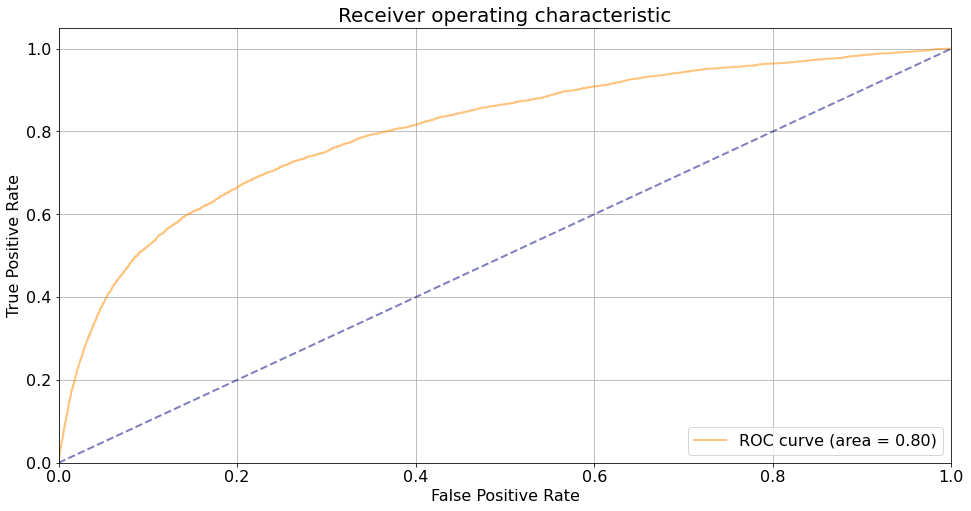

In [35]:
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 8))
lw = 2

plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc, alpha=0.5)

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--', alpha=0.5)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(True)
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('Receiver operating characteristic', fontsize=20)
plt.legend(loc="lower right", fontsize=16)
plt.show()

In [36]:
from catboost.utils import get_fpr_curve
from catboost.utils import get_fnr_curve

(thresholds, fpr) = get_fpr_curve(curve=curve)
(thresholds, fnr) = get_fnr_curve(curve=curve)

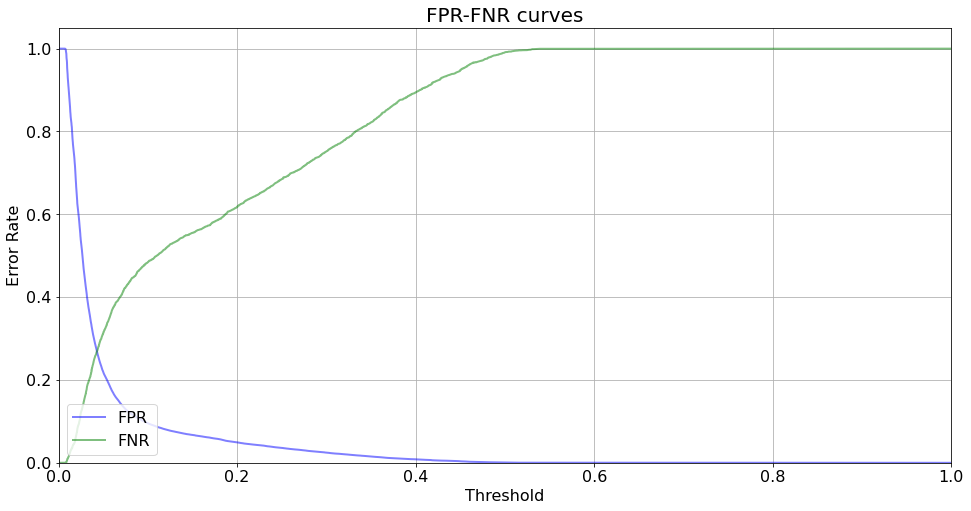

In [37]:
plt.figure(figsize=(16, 8))
lw = 2

plt.plot(thresholds, fpr, color='blue', lw=lw, label='FPR', alpha=0.5)
plt.plot(thresholds, fnr, color='green', lw=lw, label='FNR', alpha=0.5)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(True)
plt.xlabel('Threshold', fontsize=16)
plt.ylabel('Error Rate', fontsize=16)
plt.title('FPR-FNR curves', fontsize=20)
plt.legend(loc="lower left", fontsize=16)
plt.show()

In [38]:
from catboost.utils import select_threshold

print(select_threshold(model=model, data=eval_pool, FNR=0.01))
print(select_threshold(model=model, data=eval_pool, FPR=0.01))

0.010192193035935677
0.3841952084776068


## Snapshotting

In [39]:
# !rm 'catboost_info/snapshot.bkp'
from catboost import CatBoostClassifier
model = CatBoostClassifier(
    iterations=100,
    save_snapshot=True,
    snapshot_file='snapshot.bkp',
    snapshot_interval=1,
    random_seed=43
)
model.fit(
    X_train, y_train,
    eval_set=(X_validation, y_validation),
    cat_features=cat_features,
    verbose=True
)

Learning rate set to 0.368193
0:	learn: 0.4565071	test: 0.4557082	best: 0.4557082 (0)	total: 189ms	remaining: 18.7s
1:	learn: 0.3465180	test: 0.3451519	best: 0.3451519 (1)	total: 263ms	remaining: 12.9s
2:	learn: 0.2877779	test: 0.2859564	best: 0.2859564 (2)	total: 374ms	remaining: 12.1s
3:	learn: 0.2553415	test: 0.2531431	best: 0.2531431 (3)	total: 430ms	remaining: 10.3s
4:	learn: 0.2375452	test: 0.2350364	best: 0.2350364 (4)	total: 488ms	remaining: 9.27s
5:	learn: 0.2129142	test: 0.2111817	best: 0.2111817 (5)	total: 657ms	remaining: 10.3s
6:	learn: 0.2015984	test: 0.2001811	best: 0.2001811 (6)	total: 777ms	remaining: 10.3s
7:	learn: 0.1946998	test: 0.1936525	best: 0.1936525 (7)	total: 926ms	remaining: 10.6s
8:	learn: 0.1904149	test: 0.1895883	best: 0.1895883 (8)	total: 1.07s	remaining: 10.9s
9:	learn: 0.1870018	test: 0.1862323	best: 0.1862323 (9)	total: 1.34s	remaining: 12.1s
10:	learn: 0.1850937	test: 0.1843968	best: 0.1843968 (10)	total: 1.48s	remaining: 12s
11:	learn: 0.1829332	tes

94:	learn: 0.1756300	test: 0.1763723	best: 0.1763708 (90)	total: 15s	remaining: 787ms
95:	learn: 0.1755784	test: 0.1763796	best: 0.1763708 (90)	total: 15.1s	remaining: 630ms
96:	learn: 0.1755783	test: 0.1763796	best: 0.1763708 (90)	total: 15.3s	remaining: 472ms
97:	learn: 0.1755783	test: 0.1763796	best: 0.1763708 (90)	total: 15.4s	remaining: 314ms
98:	learn: 0.1755783	test: 0.1763796	best: 0.1763708 (90)	total: 15.6s	remaining: 157ms
99:	learn: 0.1755700	test: 0.1763847	best: 0.1763708 (90)	total: 15.9s	remaining: 0us

bestTest = 0.176370826
bestIteration = 90

Shrink model to first 91 iterations.


## Model predictions

In [40]:
print(model.predict_proba(data=X_validation))

[[0.9816 0.0184]
 [0.9742 0.0258]
 [0.989  0.011 ]
 ...
 [0.9869 0.0131]
 [0.9608 0.0392]
 [0.8519 0.1481]]


In [41]:
print(model.predict(data=X_validation))

[0. 0. 0. ... 0. 0. 0.]


In [42]:
raw_pred = model.predict(
    data=X_validation,
    prediction_type='RawFormulaVal'
)
print(raw_pred)

[-3.9791 -3.6325 -4.4975 ... -4.3201 -3.1983 -1.7492]


In [43]:
from numpy import exp

sigmoid = lambda x: 1 / (1 + exp(-x))

probabilities = sigmoid(raw_pred)

print(probabilities)

[0.0184 0.0258 0.011  ... 0.0131 0.0392 0.1481]


In [44]:
X_prepared = X_validation.values.astype(str).astype(object)
# For FeaturesData class categorial features must have type str

fast_predictions = model.predict_proba(
    data=FeaturesData(
        cat_feature_data=X_prepared,
        cat_feature_names=list(X_validation)
    )
)
print(fast_predictions)

[[0.9816 0.0184]
 [0.9742 0.0258]
 [0.989  0.011 ]
 ...
 [0.9869 0.0131]
 [0.9608 0.0392]
 [0.8519 0.1481]]


## Staged prediction

In [45]:
predictions_gen = model.staged_predict_proba(
    data=X_validation,
    ntree_start=0, 
    ntree_end=5, 
    eval_period=1
)
try:
    for iteration, predictions in enumerate(predictions_gen):
        print('Iteration ' + str(iteration) + ', predictions:')
        print(predictions)
except Exception:
    pass

Iteration 0, predictions:
[[0.6575 0.3425]
 [0.6575 0.3425]
 [0.6575 0.3425]
 ...
 [0.6575 0.3425]
 [0.6575 0.3425]
 [0.6575 0.3425]]
Iteration 1, predictions:
[[0.7538 0.2462]
 [0.7538 0.2462]
 [0.7538 0.2462]
 ...
 [0.7538 0.2462]
 [0.7538 0.2462]
 [0.7538 0.2462]]
Iteration 2, predictions:
[[0.8167 0.1833]
 [0.8167 0.1833]
 [0.8167 0.1833]
 ...
 [0.8167 0.1833]
 [0.8167 0.1833]
 [0.8167 0.1833]]
Iteration 3, predictions:
[[0.8587 0.1413]
 [0.8587 0.1413]
 [0.8587 0.1413]
 ...
 [0.8587 0.1413]
 [0.8587 0.1413]
 [0.8587 0.1413]]
Iteration 4, predictions:
[[0.887 0.113]
 [0.887 0.113]
 [0.887 0.113]
 ...
 [0.887 0.113]
 [0.887 0.113]
 [0.887 0.113]]


## Solving MultiClassification problem

In [46]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(
    iterations=50,
    random_seed=43,
    loss_function='MultiClass'
)
model.fit(
    X_train, y_train,
    cat_features=cat_features,
    eval_set=(X_validation, y_validation),
    verbose=False,
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

For multiclass problems with many classes sometimes it's better to solve classification problem using ranking.
To do that we will build a dataset with groups.
Every group will represent one object from our initial dataset.
But it will have one additional categorical feature - possible class value.
Target values will be equal to 1 if the class value is equal to the correct class, and 0 otherwise.
Thus each group will have exactly one 1 in labels, and some zeros.
You can put all possible class values in the group or you can try setting only hard negatives if there are too many labels.
We'll show this approach on an example of binary classification problem.

In [47]:
from copy import deepcopy
def build_multiclass_ranking_dataset(X, y, cat_features, label_values=[0,1], start_group_id=0):
    ranking_matrix = []
    ranking_labels = []
    group_ids = []

    X_train_matrix = X.values
    y_train_vector = y.values

    for obj_idx in range(X.shape[0]):
        obj = list(X_train_matrix[obj_idx])

        for label in label_values:
            obj_of_given_class = deepcopy(obj)
            obj_of_given_class.append(label)
            ranking_matrix.append(obj_of_given_class)
            ranking_labels.append(float(y_train_vector[obj_idx] == label)) 
            group_ids.append(start_group_id + obj_idx)
        
    final_cat_features = deepcopy(cat_features)
    final_cat_features.append(X.shape[1]) # new feature that we are adding should be categorical.
    return Pool(ranking_matrix, ranking_labels, cat_features=final_cat_features, group_id = group_ids)

In [48]:
from catboost import CatBoost
params = {'iterations':150, 'learning_rate':0.01, 'l2_leaf_reg':30, 'random_seed':0, 'loss_function':'QuerySoftMax'}

groupwise_train_pool = build_multiclass_ranking_dataset(X_train, y_train, cat_features, [0,1])
groupwise_eval_pool = build_multiclass_ranking_dataset(X_validation, y_validation, cat_features, [0,1], X_train.shape[0])

model = CatBoost(params)
model.fit(
    X=groupwise_train_pool,
    verbose=False,
    eval_set=groupwise_eval_pool,
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Doing predictions with ranking mode

In [49]:
import math

obj = list(X_validation.values[0])
ratings = []
for label in [0,1]:
    obj_with_label = deepcopy(obj)
    obj_with_label.append(label)
    rating = model.predict([obj_with_label])[0]
    ratings.append(rating)
print('Raw values:', np.array(ratings))

def soft_max(values):
    return [math.exp(val) / sum([math.exp(val) for val in values]) for val in values]

print('Probabilities', np.array(soft_max(ratings)))

Raw values: [ 0.5027 -0.5027]
Probabilities [0.7321 0.2679]


## Metric evaluation on a new dataset

In [50]:
model = CatBoostClassifier(
    random_seed=63,
    iterations=200,
    learning_rate=0.03,
)
model.fit(
    X_train, y_train,
    cat_features=cat_features,
    verbose=50
)

0:	learn: 0.6567667	total: 159ms	remaining: 31.6s
50:	learn: 0.1958926	total: 7.82s	remaining: 22.9s
100:	learn: 0.1804097	total: 17.9s	remaining: 17.6s
150:	learn: 0.1780282	total: 31.7s	remaining: 10.3s
199:	learn: 0.1771324	total: 47.2s	remaining: 0us


In [57]:
metrics = model.eval_metrics(
    data=validation_pool,
    metrics=['Logloss','AUC'],
    ntree_start=0,
    ntree_end=0,
    eval_period=1,
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [53]:
print('AUC values:')
print(np.array(metrics['AUC']))

AUC values:
[0.5    0.5    0.5    0.5    0.5    0.5    0.5    0.5    0.5    0.5
 0.5    0.5    0.5    0.5    0.5    0.5    0.5    0.5    0.5    0.5
 0.5    0.5    0.5    0.5    0.7573 0.7568 0.7595 0.7601 0.7603 0.7603
 0.7603 0.7603 0.7706 0.7706 0.7706 0.7752 0.7801 0.7802 0.7807 0.7829
 0.7862 0.7863 0.7873 0.7881 0.7881 0.7881 0.7887 0.7891 0.7893 0.7899
 0.7905 0.7912 0.7914 0.7915 0.7915 0.7925 0.7928 0.7933 0.7936 0.7938
 0.794  0.7941 0.7943 0.7945 0.7945 0.7947 0.7947 0.7948 0.7949 0.795
 0.7952 0.7953 0.7954 0.7958 0.7961 0.796  0.7961 0.7962 0.7965 0.7967
 0.7969 0.7973 0.7975 0.7978 0.798  0.7982 0.7982 0.7984 0.7984 0.7986
 0.7989 0.7991 0.7992 0.7993 0.7995 0.7996 0.7998 0.7999 0.8002 0.8003
 0.8004 0.8006 0.8006 0.8009 0.801  0.8011 0.8015 0.8017 0.802  0.8022
 0.8024 0.8025 0.8028 0.8031 0.8034 0.8036 0.8038 0.8041 0.8042 0.8043
 0.8045 0.8046 0.805  0.8052 0.8053 0.8054 0.8056 0.8057 0.8059 0.806
 0.8063 0.8065 0.8066 0.8067 0.807  0.8071 0.8072 0.8073 0.8076 0.8076
 0


## Feature importances

### Prediction Values Change

Default feature importances for binary classification is PredictionValueChange - how much on average does the model change the feature value changes. These feature importances are non negative. They are normalized and sum to 1, so you can look on these values like percentage of importance.

In [54]:
model.get_feature_importance(prettified=True)

,Feature Id,Importances
0,tipo_acidente,41.157980
1,causa_acidente,17.186151
2,tipo_pista,12.845285
3,fase_dia,12.253997
4,uf,11.269253
5,dia_semana,2.397223
6,condicao_metereologica,2.293095
7,sentido_via,0.597016


### Loss Function Change

The non default feature importance approximates how much the optimized loos function will change if the value of the feature changes. This importance might be negative if the feature has bad influence on the loss function. The importances are not normalized, the absolute value of the importance has the same scale as the optimized loss value. To calculate this importance value you need to pass train_pool as an argument.

In [59]:
np.array(model.get_feature_importance(
    train_pool,
    'LossFunctionChange',
    prettified=True
))

array([['tipo_acidente', 0.017380613586107103],
       ['causa_acidente', 0.002601201358747823],
       ['fase_dia', 0.0023488081073263127],
       ['tipo_pista', 0.001839430248275873],
       ['uf', 0.0017928923402197917],
       ['dia_semana', 0.0003794190804970501],
       ['condicao_metereologica', 0.00033765505756770214],
       ['sentido_via', 9.157535541267961e-05]], dtype=object)

## Shap values

In [61]:
shap_values = model.get_feature_importance(validation_pool, type='ShapValues')
expected_value = shap_values[0,-1]
shap_values = shap_values[:,:-1]
print(shap_values.shape)

(88966, 8)


In [62]:
import shap

shap.initjs()
shap.force_plot(expected_value, shap_values[3,:], X.iloc[3,:])

In [63]:
import shap

shap.initjs()
shap.force_plot(expected_value, shap_values[91,:], X.iloc[91,:])

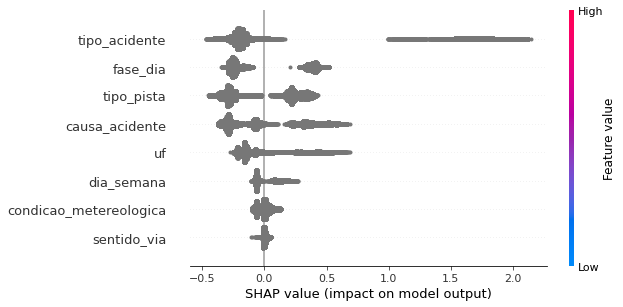

In [64]:
shap.summary_plot(shap_values, X)

In [65]:
X_small = X.iloc[0:200]
shap_small = shap_values[:200]
shap.force_plot(expected_value, shap_small, X_small)

## Feature evaluation

In [56]:
# from catboost.eval.catboost_evaluation import *
# learn_params = {'iterations': 20, # 2000
#                 'learning_rate': 0.5, # we set big learning_rate,
#                                       # because we have small
#                                       # #iterations
#                 'random_seed': 0,
#                 'verbose': False,
#                 'loss_function' : 'Logloss',
#                 'boosting_type': 'Plain'}
# evaluator = CatboostEvaluation('amazon/train.tsv',
#                                fold_size=10000, # <= 50% of dataset
#                                fold_count=20,
#                                column_description='amazon/train.cd',
#                                partition_random_seed=0,
#                                #working_dir=... 
# )
# result = evaluator.eval_features(learn_config=learn_params,
#                                  eval_metrics=['Logloss', 'Accuracy'],
#                                  features_to_eval=[6, 7, 8])

In [57]:
# from catboost.eval.evaluation_result import *
# logloss_result = result.get_metric_results('Logloss')
# logloss_result.get_baseline_comparison(
#     ScoreConfig(ScoreType.Rel, overfit_iterations_info=False)
# )

,PValue,Score,Quantile 0.005,Quantile 0.995,Decision
Features: 6,0.000449,1.039991,0.617431,1.467979,GOOD
Features: 7,0.681322,-0.028710,-0.351553,0.287576,UNKNOWN
Features: 8,0.262722,-0.206858,-0.630120,0.194727,UNKNOWN


## Saving the model

In [66]:
my_best_model = CatBoostClassifier(iterations=10)
my_best_model.fit(
    X_train, y_train,
    eval_set=(X_validation, y_validation),
    cat_features=cat_features,
    verbose=False
)
my_best_model.save_model('catboost_model.bin')
my_best_model.save_model('catboost_model.json', format='json')

In [67]:
my_best_model.load_model('catboost_model.bin')
print(my_best_model.get_params())
print(my_best_model.random_seed_)

{'iterations': 10, 'loss_function': 'Logloss', 'logging_level': 'Silent', 'verbose': 0}
0


## Hyperparameter tunning

### Training speed

In [68]:
from catboost import CatBoost
fast_model = CatBoostClassifier(
    random_seed=63,
    iterations=150,
    learning_rate=0.01,
    boosting_type='Plain',
    bootstrap_type='Bernoulli',
    subsample=0.5,
    one_hot_max_size=20,
    rsm=0.5,
    leaf_estimation_iterations=5,
    max_ctr_complexity=1)

fast_model.fit(
    X_train, y_train,
    cat_features=cat_features,
    verbose=False,
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

### Accuracy

In [69]:
tunned_model = CatBoostClassifier(
    random_seed=63,
    iterations=1000,
    learning_rate=0.03,
    l2_leaf_reg=3,
    bagging_temperature=1,
    random_strength=1,
    one_hot_max_size=2,
    leaf_estimation_method='Newton'
)
tunned_model.fit(
    X_train, y_train,
    cat_features=cat_features,
    verbose=False,
    eval_set=(X_validation, y_validation),
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

## Training the model after parameter tunning

In [70]:
best_model = CatBoostClassifier(
    random_seed=63,
    iterations=int(tunned_model.tree_count_ * 1.2),
)
best_model.fit(
    X, y,
    cat_features=cat_features,
    verbose=100
)

Learning rate set to 0.117969
0:	learn: 0.5599805	total: 202ms	remaining: 4m 1s
100:	learn: 0.1757932	total: 39.9s	remaining: 7m 12s
200:	learn: 0.1744602	total: 1m 25s	remaining: 7m 1s
300:	learn: 0.1734836	total: 2m 12s	remaining: 6m 34s
400:	learn: 0.1727029	total: 2m 58s	remaining: 5m 54s
500:	learn: 0.1719908	total: 3m 44s	remaining: 5m 12s
600:	learn: 0.1712455	total: 4m 24s	remaining: 4m 22s
700:	learn: 0.1705113	total: 5m 3s	remaining: 3m 35s
800:	learn: 0.1698481	total: 5m 43s	remaining: 2m 50s
900:	learn: 0.1691780	total: 6m 23s	remaining: 2m 6s
1000:	learn: 0.1685838	total: 7m 7s	remaining: 1m 24s
1100:	learn: 0.1679687	total: 7m 55s	remaining: 41.9s
1197:	learn: 0.1674033	total: 8m 41s	remaining: 0us


## Calculate predictions for the contest

In [63]:
X_test = test_df.drop('id', axis=1)
test_pool = Pool(data=X_test, cat_features=cat_features)
contest_predictions = best_model.predict_proba(test_pool)
print('Predictoins:')
print(contest_predictions)

Predictoins:
[[0.2754 0.7246]
 [0.0157 0.9843]
 [0.0101 0.9899]
 ...
 [0.0069 0.9931]
 [0.0561 0.9439]
 [0.0147 0.9853]]


## Prepare the submission

In [64]:
f = open('submit.csv', 'w')
f.write('Id,Action\n')
for idx in range(len(contest_predictions)):
    line = str(test_df['id'][idx]) + ',' + str(contest_predictions[idx][1]) + '\n'
    f.write(line)
f.close()

Submit your solution [here](https://www.kaggle.com/c/amazon-employee-access-challenge/submit).
Good luck!!!